In [1]:
import json

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
K=8
death_ratio = np.array([0.00000000e+00, 3.36964689e-06, 2.19595034e-05, 4.49107573e-05,
               1.88422215e-04, 4.99762978e-04, 1.89895681e-03, 7.40632275e-03])

all_death = pd.read_csv("../data/orszagos_halott.csv", sep=',')[:755]
death_orig = np.array(all_death[181:181+180]["Hétnapos mozgóátlag"])

In [3]:
sett_types = pd.read_csv("../../../data/hun/HU_places_admin_pop_ZIP_latlon.csv",
           sep=',',
           header=0)

KSH = pd.read_csv("../../../data/hun/KSHCommuting_c1ID_c1name_c2ID_c2name_comm_school_work_DIR.csv",
           sep=',',
           header=0)

pops = sett_types.set_index("place").to_dict()["population"]
pops_code = sett_types.set_index("KSH code").to_dict()["population"]

In [4]:
def get_inf_curve(filename, death = None, K= 8):
    df = pd.read_csv(filename, sep=',')
    inf_cols = [c for c in df.columns if c[0:2]=='I_']
    inf_cols2 = [c for c in df.columns if c[0:2]=='I2']
    Is = df.filter(inf_cols, axis=1)
    Is2 = df.filter(inf_cols2, axis=1)
    
    I = np.zeros((len(Is), K, len(Is.columns)//K))
    for c in Is.columns:
        _,city,age = c.split("_")
        I[:,int(age), int(city)] = Is.loc[:, c]
    I2 = np.zeros((len(Is2), K, len(Is2.columns)//K))
    for c in Is2.columns:
        _,city,age = c.split("_")
        I2[:,int(age), int(city)] = Is2.loc[:, c]
    
    I = np.sum(I, axis=2)
    I2 = np.sum(I2, axis=2)
    if type(death) != None:
        return np.sum(I*death, axis=1)+np.sum(I2*death, axis=1), Is.sum(axis=1), Is2.sum(axis=1)
    else:
        return Is.sum(axis=1), Is2.sum(axis=1)

def get_inf(filename, death = None, K= 8):
    df = pd.read_csv(filename, sep=',')
    inf_cols = [c for c in df.columns if c[0:2]=='I_']
    inf_cols2 = [c for c in df.columns if c[0:2]=='I2']
    Is = df.filter(inf_cols, axis=1)
    Is2 = df.filter(inf_cols2, axis=1)
    
    I = np.zeros((len(Is), K, len(Is.columns)//K))
    for c in Is.columns:
        _,city,age = c.split("_")
        I[:,int(age), int(city)] = Is.loc[:, c]
    I2 = np.zeros((len(Is2), K, len(Is2.columns)//K))
    for c in Is2.columns:
        _,city,age = c.split("_")
        I2[:,int(age), int(city)] = Is2.loc[:, c]
    
    return I.sum(axis=1),I2.sum(axis=1)
    
def get_inf_curve2(filename, death_ratio, all_death, K= 8):
    df = pd.read_csv(filename, sep=',')
    inf_cols = [c for c in df.columns if c[0:2]=='I_']
    inf_cols2 = [c for c in df.columns if c[0:2]=='I2']
    Is = df.filter(inf_cols, axis=1)
    Is2 = df.filter(inf_cols2, axis=1)
    
    I = np.zeros((len(Is), K, len(Is.columns)//K))
    for c in Is.columns:
        _,city,age = c.split("_")
        I[:,int(age), int(city)] = Is.loc[:, c]
    I2 = np.zeros((len(Is2), K, len(Is2.columns)//K))
    for c in Is2.columns:
        _,city,age = c.split("_")
        I2[:,int(age), int(city)] = Is2.loc[:, c]
    
    I = np.sum(I, axis=2)
    I2 = np.sum(I2, axis=2)
    if type(death) != None:
        return np.sum(I*death_ratio*(all_death/np.sum(I)), axis=1), Is.sum(axis=1), Is2.sum(axis=1)
    else:
        return Is.sum(axis=1), Is2.sum(axis=1)

def fit(x,y):
    min_ind = 0
    MIN = 1e12
    for shift in range(25):
        orig_shifted = x[shift:len(y)+25-(25-shift)]
        l2 = np.sqrt(np.sum((orig_shifted-y)**2))
        if l2 < MIN:
            MIN = l2
            min_ind = shift
    return min_ind, MIN


# District aggregation

### Original:

$$
w_{k,l} = \frac{\sum\limits_{i \in I_k} \sum\limits_{j \in I_l} w_{i,j} n_i n_j}{m_k m_l}
$$

### New:
$$
\hat{w}_{k,l} = \frac{\sum\limits_{i \in I_k} \sum\limits_{j \in I_l} w_{i,j}\phi_j n_i n_j}{m_k \sum\limits_{j \in I_l}\phi_j n_j}
$$

City has 10.69% less total infections
City has 9.18% less total infections
City has 1.57% less total infections
City has -2.49% less total infections
City has 1.05% less total infections
City has -2.50% less total infections


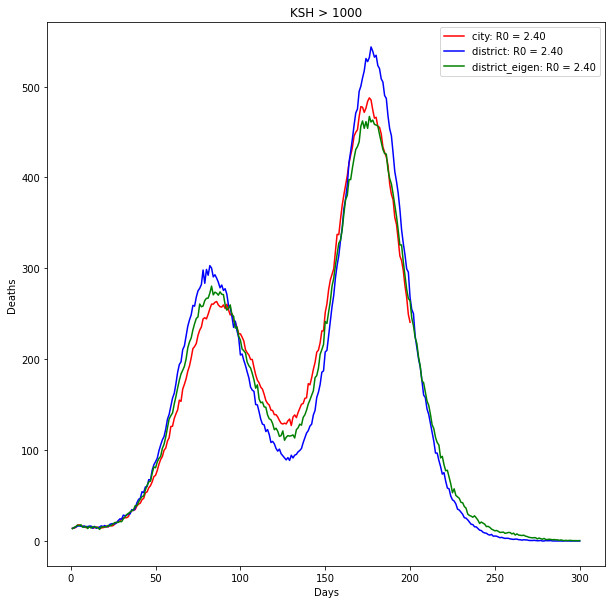

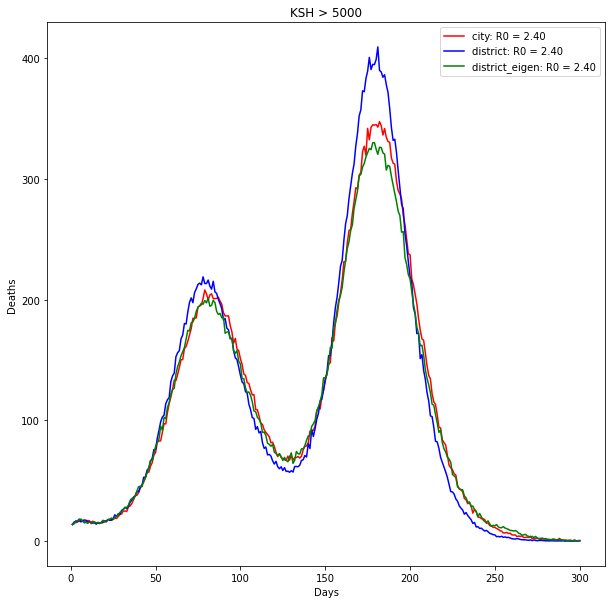

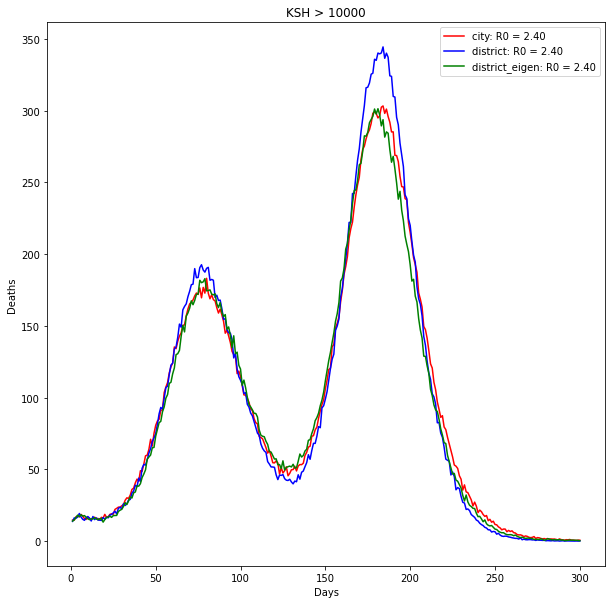

In [5]:
for th in [1000, 5000, 10000]:
    plt.figure(figsize=(10,10))
    city = f"KSH2_{th}/base"
    district = f"KSH2_{th}/district"
    district_eigen = f"KSH2_{th}/district_eigen"

    R0 = np.linspace(2.0, 2.6, 10)
    for i in [6]:
        death, Is, Is2 = get_inf_curve(f"../../output/{city}/{i}.txt", death = death_ratio*10)
        death_d, Is_d, Is2_d = get_inf_curve(f"../../output/{district}/{i}.txt", death = death_ratio*10)
        death_d2, Is_d2, Is2_d2 = get_inf_curve(f"../../output/{district_eigen}/{i}.txt", death = death_ratio*10)

        x = np.array(list(range(1, len(death)+1)))
        plt.plot(x, death, label=f"city: R0 = {R0[i]:.2f}", c='r')
        x = np.array(list(range(1, len(death_d)+1)))
        plt.plot(x, death_d, label=f"district: R0 = {R0[i]:.2f}", c='b')
        x = np.array(list(range(1, len(death_d2)+1)))
        plt.plot(x, death_d2, label=f"district_eigen: R0 = {R0[i]:.2f}", c='g')

    plt.legend()
    plt.xlabel('Days')
    plt.ylabel("Deaths")
    plt.title(f"KSH > {th}")

    print(f"City has {100-100*sum(death)/sum(death_d):.2f}% less total infections")
    print(f"City has {100-100*sum(death)/sum(death_d2):.2f}% less total infections")

City has 1.06% less total infections
City has 0.62% less total infections


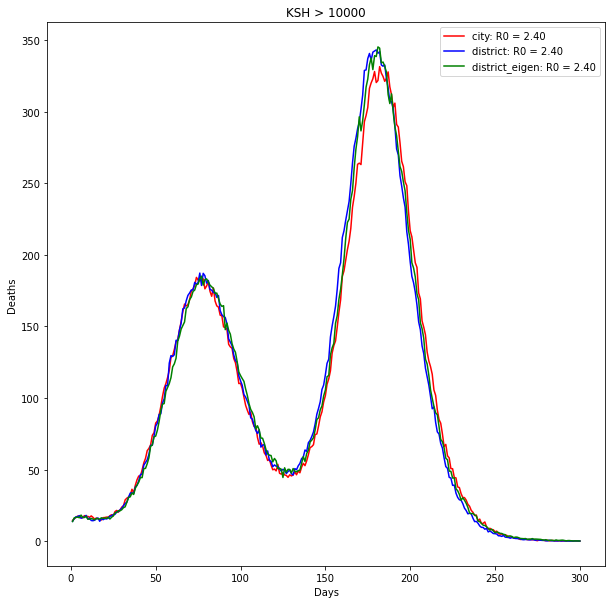

In [26]:
for th in [10000]:
    plt.figure(figsize=(10,10))
    city = f"KSH2_{th}/base"
    district = f"KSH2_{th}/district"
    district_eigen = f"KSH2_{th}/district_eigen"

    R0 = np.linspace(2.0, 2.6, 10)
    for i in [6]:
        death, Is, Is2 = get_inf_curve(f"../../output/{city}/{i}.txt", death = death_ratio*10)
        death_d, Is_d, Is2_d = get_inf_curve(f"../../output/{district}/{i}.txt", death = death_ratio*10)
        death_d2, Is_d2, Is2_d2 = get_inf_curve(f"../../output/{district_eigen}/{i}.txt", death = death_ratio*10)

        x = np.array(list(range(1, len(death)+1)))
        plt.plot(x, death, label=f"city: R0 = {R0[i]:.2f}", c='r')
        x = np.array(list(range(1, len(death_d)+1)))
        plt.plot(x, death_d, label=f"district: R0 = {R0[i]:.2f}", c='b')
        x = np.array(list(range(1, len(death_d2)+1)))
        plt.plot(x, death_d2, label=f"district_eigen: R0 = {R0[i]:.2f}", c='g')

    plt.legend()
    plt.xlabel('Days')
    plt.ylabel("Deaths")
    plt.title(f"KSH > {th}")

    print(f"City has {100-100*sum(death)/sum(death_d):.2f}% less total infections")
    print(f"City has {100-100*sum(death)/sum(death_d2):.2f}% less total infections")

City has nan% less total infections
City has nan% less total infections


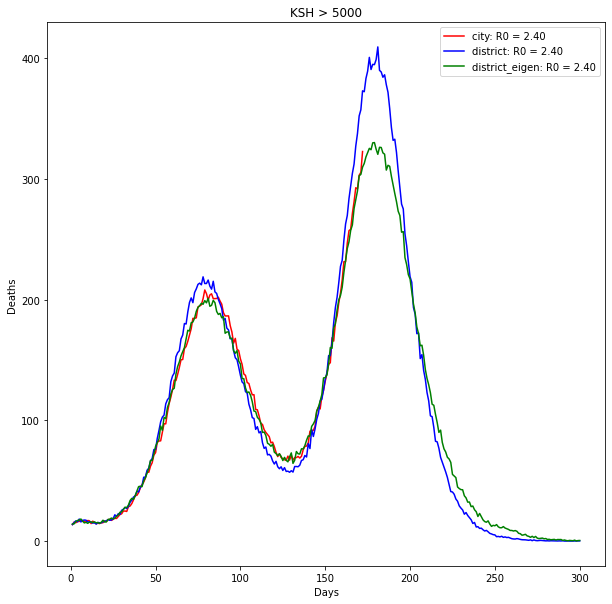

In [27]:
for th in [5000]:
    plt.figure(figsize=(10,10))
    city = f"KSH2_{th}/base"
    district = f"KSH2_{th}/district"
    district_eigen = f"KSH2_{th}/district_eigen"

    R0 = np.linspace(2.0, 2.6, 10)
    for i in [6]:
        death, Is, Is2 = get_inf_curve(f"../../output/{city}/{i}.txt", death = death_ratio*10)
        death_d, Is_d, Is2_d = get_inf_curve(f"../../output/{district}/{i}.txt", death = death_ratio*10)
        death_d2, Is_d2, Is2_d2 = get_inf_curve(f"../../output/{district_eigen}/{i}.txt", death = death_ratio*10)

        x = np.array(list(range(1, len(death)+1)))
        plt.plot(x, death, label=f"city: R0 = {R0[i]:.2f}", c='r')
        x = np.array(list(range(1, len(death_d)+1)))
        plt.plot(x, death_d, label=f"district: R0 = {R0[i]:.2f}", c='b')
        x = np.array(list(range(1, len(death_d2)+1)))
        plt.plot(x, death_d2, label=f"district_eigen: R0 = {R0[i]:.2f}", c='g')

    plt.legend()
    plt.xlabel('Days')
    plt.ylabel("Deaths")
    plt.title(f"KSH > {th}")

    print(f"City has {100-100*sum(death)/sum(death_d):.2f}% less total infections")
    print(f"City has {100-100*sum(death)/sum(death_d2):.2f}% less total infections")

City has 10.69% less total infections
City has 9.18% less total infections
City has 1.00% less total infections
City has -4.35% less total infections
City has 2.06% less total infections
City has -1.69% less total infections


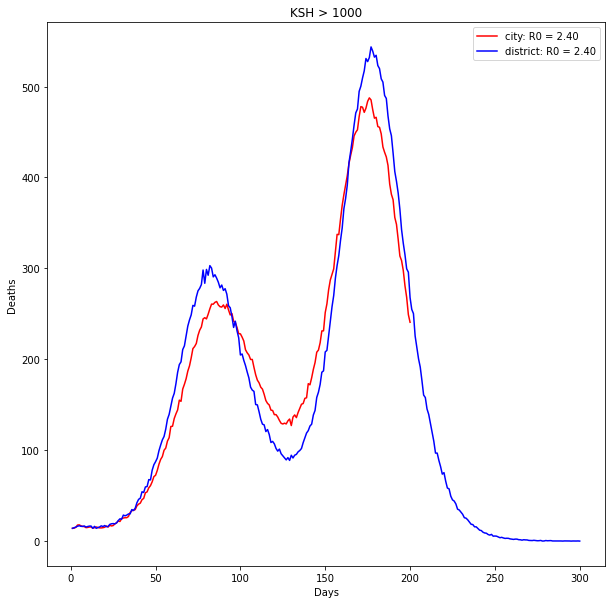

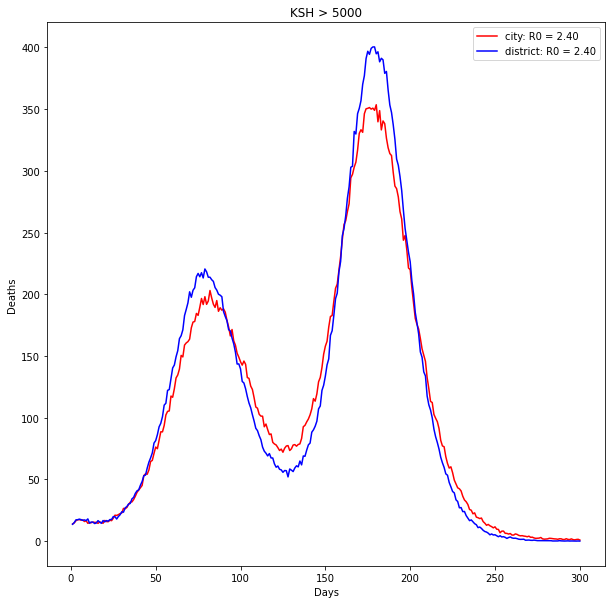

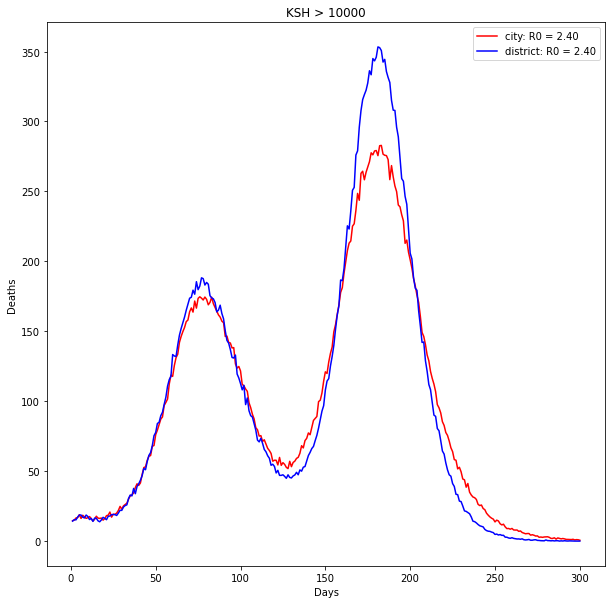

In [6]:
for th in [1000, 5000, 10000]:
    plt.figure(figsize=(10,10))
    city = f"KSH2_{th}/base"
    district = f"KSH2_{th}/district"
    district_eigen = f"KSH2_{th}/district_eigen"

    R0 = np.linspace(2.0, 2.6, 10)
    for i in [6]:
        death, Is, Is2 = get_inf_curve(f"../../output/{city}/{i}.txt", death = death_ratio*10)
        death_d, Is_d, Is2_d = get_inf_curve(f"../../output/{district}/{i}.txt", death = death_ratio*10)
        death_d2, Is_d2, Is2_d2 = get_inf_curve(f"../../output/{district_eigen}/{i}.txt", death = death_ratio*10)

        x = np.array(list(range(1, len(death)+1)))
        plt.plot(x, death, label=f"city: R0 = {R0[i]:.2f}", c='r')
        x = np.array(list(range(1, len(death_d)+1)))
        plt.plot(x, death_d, label=f"district: R0 = {R0[i]:.2f}", c='b')
        #x = np.array(list(range(1, len(death_d2)+1)))
        #plt.plot(x, death_d2, label=f"district_eigen: R0 = {R0[i]:.2f}", c='g')

    plt.legend()
    plt.xlabel('Days')
    plt.ylabel("Deaths")
    plt.title(f"KSH > {th}")

    print(f"City has {100-100*sum(death)/sum(death_d):.2f}% less total infections")
    print(f"City has {100-100*sum(death)/sum(death_d2):.2f}% less total infections")

In [15]:
phis = []
cities = []
for th in [1000,5000,10000]:
    with open(f'../../input/hun_{th}/{th}.npy', 'rb') as f:
        phi_act = np.load(f)
    with open(f'../../input/hun_{th}/{th}_cities.npy', 'rb') as f:
        cities_act = np.load(f)
    cities.append(cities_act)
    phis.append(phi_act)

phi_1000,phi_5000,phi_10000 = phis
cities_1000,cities_5000,cities_10000 = cities

In [16]:

d_1000 = {city:p for city,p in zip(cities_1000, phi_1000)}
d_1000["Budapest"]=np.mean([d_1000[f"Budapest {ker:02d}. ker."] for ker in range(1,24)])

d_5000 = {city:p for city,p in zip(cities_5000, phi_5000)}
d_5000["Budapest"]=np.mean([d_5000[f"Budapest {ker:02d}. ker."] for ker in range(1,24)])

d_10000 = {city:p for city,p in zip(cities_10000, phi_10000)}
d_10000["Budapest"]=np.mean([d_10000[f"Budapest {ker:02d}. ker."] for ker in range(1,24)])

print(len(d_5000), len(d_10000))

295 168


In [12]:
arr = np.array([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.013283985965498069, 0.03959355071265611, 0.041972635423070975, 0.05864552050772551, 0.06094854559960014, 0.062308212886282306, 0.06450839170433666, 0.06889160145163316, 0.07760947102251667, 0.08568311522313891, 0.0882547695617467, 0.10142304338588987, 0.1054693442028097, 0.11772419756956631, 0.12270285494398, 0.12809177374555744, 0.14631931028806439, 0.15269624350582653, 0.15303705562944264, 0.15412469997896594, 0.1546139505203289, 0.16802548319442145, 0.16909791452682157, 0.18395977229121524, 0.19283061825593836, 0.19313418112429612, 0.2160198221559861, 0.24074282863264235, 0.2415215064060732, 0.24559480138784517, 0.26314354023243136, 0.27029759631445016, 0.2739207924329505, 0.2816436674082635, 0.2823300334107692, 0.2853202530113073, 0.2931244692043283, 0.30131379589579094, 0.32141859751743546, 0.33829381337412945, 0.34114089879385745, 0.3509393452700336, 0.35747442186831796, 0.36206720779547535, 0.3871682286737839, 0.40200174745801137, 0.4043073136422043, 0.4063495027249109, 0.4087275850787874, 0.44176230091542135, 0.4470436850868944, 0.4675745665409676, 0.5061846060253047, 0.543030970089558, 0.5481188499012808, 0.5547901275499167, 0.5583634206409778, 0.571840086246219, 0.5829964151281756, 0.6117620334160122, 0.6836931015854851, 0.690605031550314, 0.7027105523841933, 0.7125859142983544, 0.7206160654919469, 0.7463926019405017, 0.7900029502565709, 0.7914551013460558, 0.800902633680199, 0.9243472556952871, 0.9567423072519715, 0.9656046096569411, 0.9815330370879319, 1.0259865142553797, 1.0315758174909977, 1.084931106037331, 1.108385294954164, 1.1135953683200819, 1.1484216394056597, 1.1970231683131936, 1.4331626211355166, 1.49205236858696, 1.5323948705191572, 1.5522724087836304, 1.8798632542384972, 1.9583585847903033, 2.0156483257922244, 2.2389374671269207, 2.37402602886937, 2.4534145511933287, 2.6094797708397746, 2.713038551227487, 2.9739128933304366, 3.4192687625027327, 3.962505401100793, 5.09392012796297, 5.500967419088955, 8.195490713903075, 10.121356661831529, 11.120603384335057, 2475.219630083567, 2548.4426037436456, 2799.3825301372326, 3019.215788945251, 3804.941894867983, 3833.985738162237, 3887.889008914738, 4176.908299262662, 4372.97781232875, 4395.0239835139755, 4768.311519361849, 4791.422059589375, 4833.540481123499, 5037.81030780335, 5212.556016512051, 5369.801126691795, 7185.868641707648, 7241.6932253422365, 7268.8537182049195, 7460.079813273228, 7611.465913038791, 8618.742395177807, 8741.743105783291, 9193.076045518508, 9397.171252770071, 9612.363670963088, 10123.760051577045, 10344.691818203666, 11057.17836766274, 11470.97159455425, 11832.499433268795, 11994.448925634455, 12576.910474464536, 13105.9798354598, 13293.471788887156, 13636.897453794689, 17941.964642996314, 18318.062885779895, 20745.14842516895, 20936.880005424948, 21097.963236326184, 21760.937786938957, 23244.284017240905, 24744.17012676798, 28338.8925119194, 48140.81426403047, 50939.00607850582, 54130.41751191435, 54320.78370540469, 60251.090232018985, 69364.2579276757, 87126.62998834024, 104468.38903638537, 141456.176534295, 160125.42113490807])

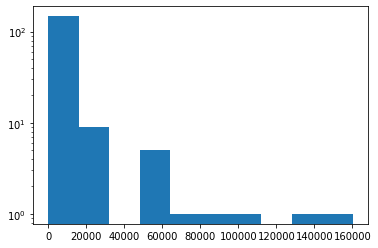

In [13]:
plt.hist(arr)
plt.yscale("log")

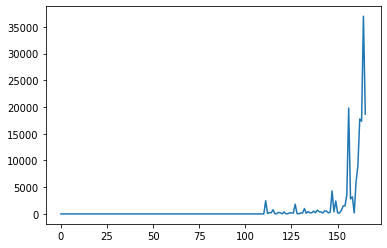

In [15]:
plt.plot(arr[1:]-arr[:-1])
#plt.yscale('log')

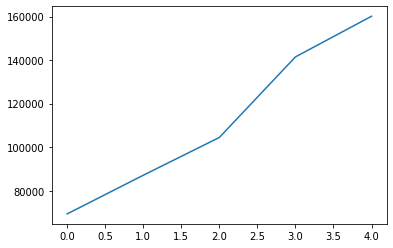

In [16]:
plt.plot(arr[-5:])

In [25]:
1/((arr[-1]-arr[-2])*0.4/100000)

13.391007796415623

In [21]:
1/2.5

0.4

# Correlation (largest eigenvector, the spacial distribution of the inf.)

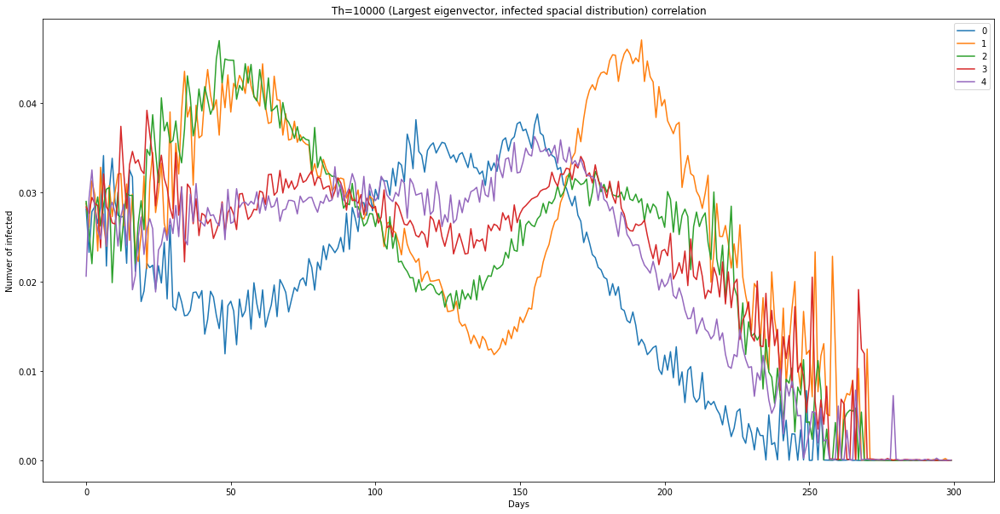

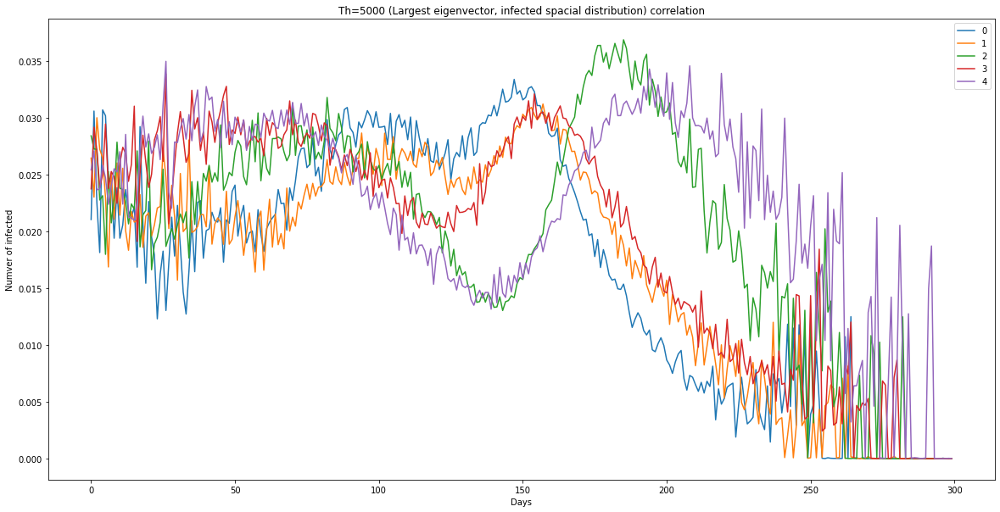

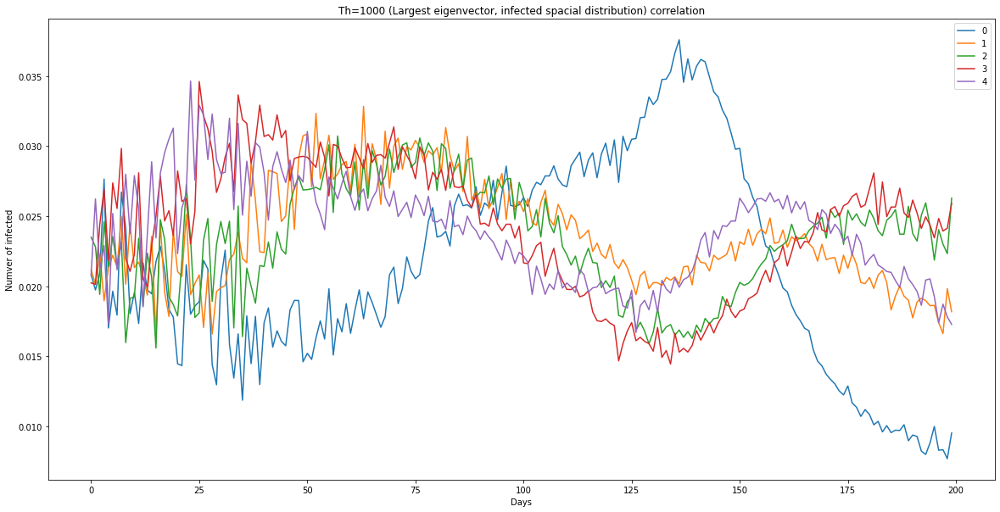

In [78]:
for th,phi in [(10000,phi_10000),(5000,phi_5000),(1000,phi_1000)]:
    city = f"KSH2_{th}/base"
    district = f"KSH2_{th}/district"
    district_eigen = f"KSH2_{th}/district_eigen"

    for model in [city]:
        plt.figure(figsize=(20,10))
        I_all = []
        for i in range(10):
            I, I2 = get_inf(f"../../output/{model}/{i}.txt", death = death_ratio*10)

            I_all = I+I2 if (len(I_all)==0) else I_all+I+I2
            if i<5:
                plt.plot([np.correlate((I+I2)[i]/np.sum((I+I2)[i]), phi) for i in range(len(I_all))], label=f"{i}", alpha=1.0)


        #plt.plot([np.correlate((I_all)[i]/np.sum((I_all)[i]), phi) for i in range(len(I_all))], label="All")
        plt.xlabel("Days")
        plt.ylabel("Numver of infected")
        plt.title(f"Th={th} (Largest eigenvector, infected spacial distribution) correlation")
        plt.legend()
        plt.show()

(300, 111)


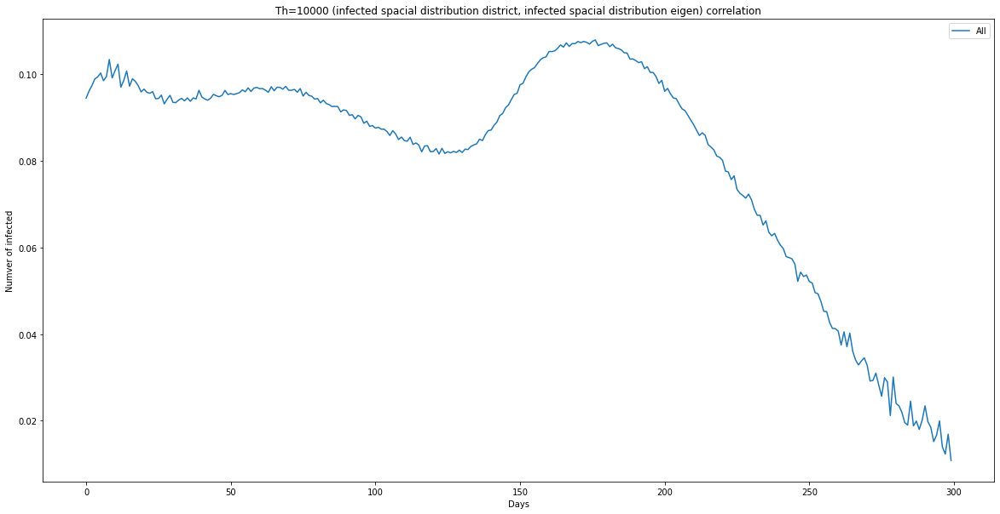

(300, 147)


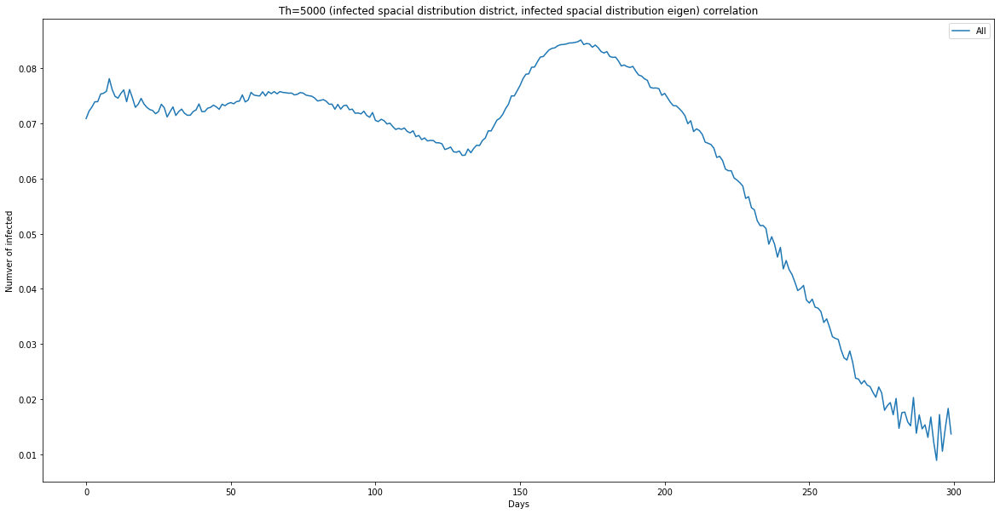

(300, 175)


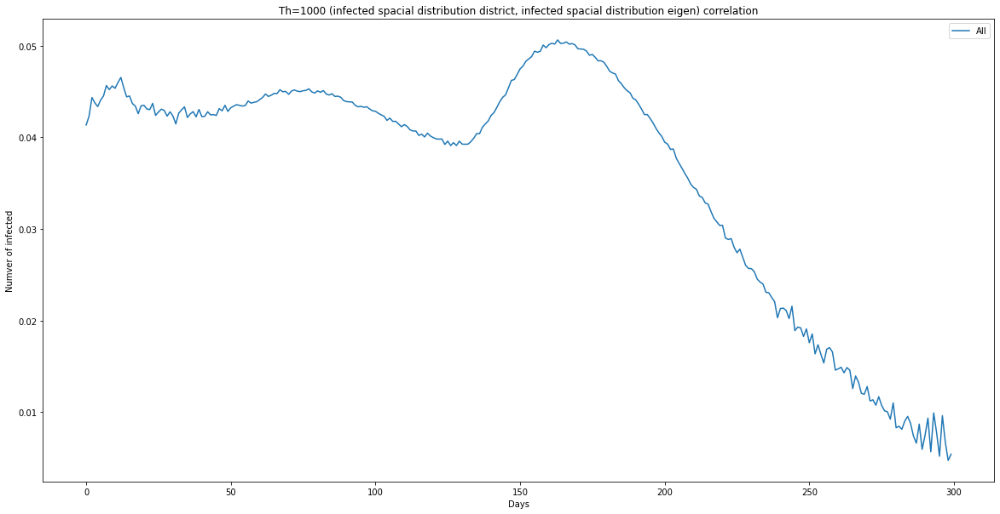

In [76]:
for th,phi in [(10000,phi_10000),(5000,phi_5000),(1000,phi_1000)]:
    city = f"KSH2_{th}/base"
    district = f"KSH2_{th}/district"
    district_eigen = f"KSH2_{th}/district_eigen"

    for model in [city]:
        plt.figure(figsize=(20,10))
        I_all = []
        I_all_ = []
        for i in range(10):
            I, I2 = get_inf(f"../../output/{district}/{i}.txt", death = death_ratio*10)
            I_, I2_ = get_inf(f"../../output/{district_eigen}/{i}.txt", death = death_ratio*10)

            I_all = I+I2 if (len(I_all)==0) else I_all+I+I2
            I_all_ = I_+I2_ if (len(I_all_)==0) else I_all_+I_+I2_
            
        print(I_all.shape)
        plt.plot([np.correlate((I_all)[i]/np.sum((I_all)[i]), (I_all_)[i]/np.sum((I_all_)[i])) for i in range(len(I_all))], label="All")
        plt.xlabel("Days")
        plt.ylabel("Numver of infected")
        plt.title(f"Th={th} (infected spacial distribution district, infected spacial distribution eigen) correlation")
        plt.legend()
        plt.show()

# Confidence interval (95%)

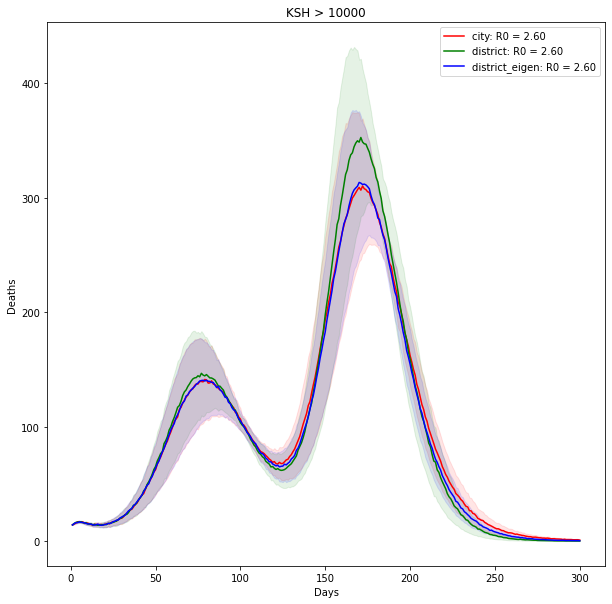

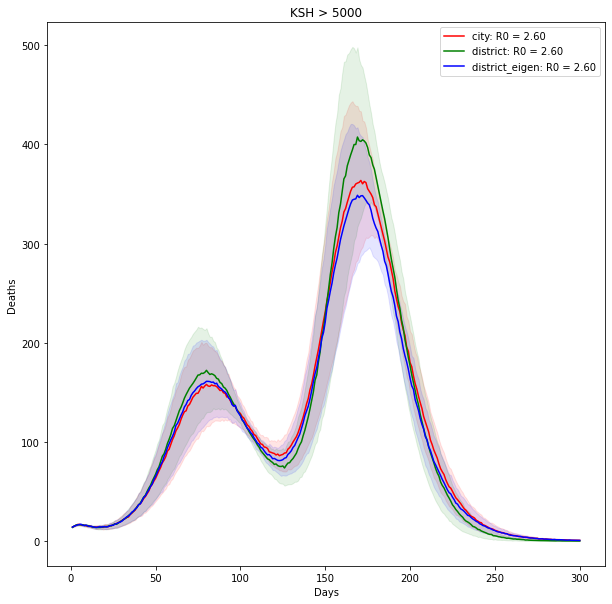

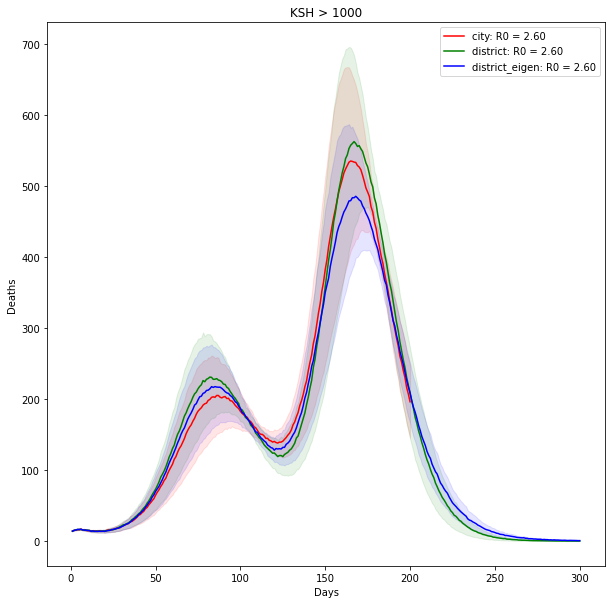

In [72]:
for th in [10000, 5000, 1000]:
#for th in [10000]:
    plt.figure(figsize=(10,10))
    city = f"KSH2_{th}/base"
    district = f"KSH2_{th}/district"
    district_eigen = f"KSH2_{th}/district_eigen"

    R0 = np.linspace(2.0, 2.6, 10)
    death_all0 = []
    death_all1 = []
    death_all2 = []
    for i in range(10):
        death, Is, Is2 = get_inf_curve(f"../../output/{city}/{i}.txt", death = death_ratio*10)
        death_d, Is_d, Is2_d = get_inf_curve(f"../../output/{district}/{i}.txt", death = death_ratio*10)
        death_d2, Is_d2, Is2_d2 = get_inf_curve(f"../../output/{district_eigen}/{i}.txt", death = death_ratio*10)
        
        death_all0.append(death)
        death_all1.append(death_d)
        death_all2.append(death_d2)
    
    for death_all,c,label in zip([death_all0, death_all1, death_all2],['r','g','b'],['city','district','district_eigen']):
        x = np.array(list(range(1, len(death_all[0])+1)))
        y = np.mean(death_all, axis=0)
        std = np.std(death_all, axis=0)
        ci = 1.96 * np.std(death_all, axis=0)/np.sqrt(len(death_all))
        plt.plot(x, y, label=f"{label}: R0 = {R0[i]:.2f}", c=c)
        plt.fill_between(x, y-ci, y+ci, color=c, alpha=0.1)
    
    plt.legend()
    plt.xlabel('Days')
    plt.ylabel("Deaths")
    plt.title(f"KSH > {th}")

In [69]:
import json
import numpy as np
import matplotlib.pyplot as plt

# Absolute value

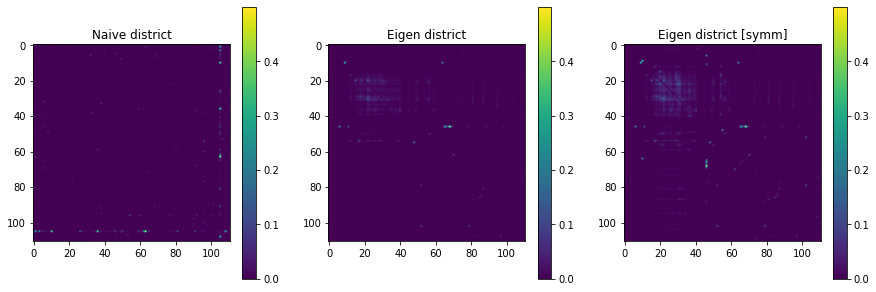

In [75]:
base_file = "../../input/hun_10000/{}/commuting_KSH.json"

fig,axs = plt.subplots(1,3,figsize=(15,5))
for ax,label,filename in zip(
    axs, ["Naive district", "Eigen district", "Eigen district [symm]"],
    [base_file.format(t) for t in ["district", "district_eigen", "district_eigen_symm"]]):
    
    with open(filename) as f:
        d = json.load(f)

    mtx = np.zeros((d['N'],d['N']), dtype=np.float32)
    for edge in d["network"]:
        mtx[edge['from'],edge['to']]=edge['weight']

    ax.imshow(mtx)
    ax.set_title(label)
    fig.colorbar(im, ax=ax)

# Relative value to transpose

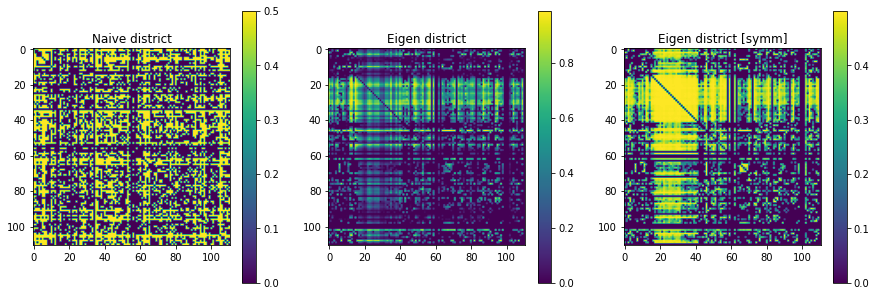

In [5]:
base_file = "../../input/hun_10000/{}/commuting_KSH.json"

fig,axs = plt.subplots(1,3,figsize=(15,5))
for ax,label,filename in zip(
    axs, ["Naive district", "Eigen district", "Eigen district [symm]"],
    [base_file.format(t) for t in ["district", "district_eigen", "district_eigen_symm"]]):
    
    with open(filename) as f:
        d = json.load(f)

    mtx = np.zeros((d['N'],d['N']), dtype=np.float32)
    for edge in d["network"]:
        mtx[edge['from'],edge['to']]=edge['weight']
        
    nulls = 1*((mtx+mtx.T)==0)
    im = ax.imshow(mtx/(mtx+mtx.T+0.00000001))
    #im = ax.imshow(mtx/((mtx+mtx.T+nulls)/2))
    ax.set_title(label)

    fig.colorbar(im, ax=ax)

City has 1.05% less total infections
City has -2.50% less total infections
City has 1.57% less total infections
City has -2.49% less total infections


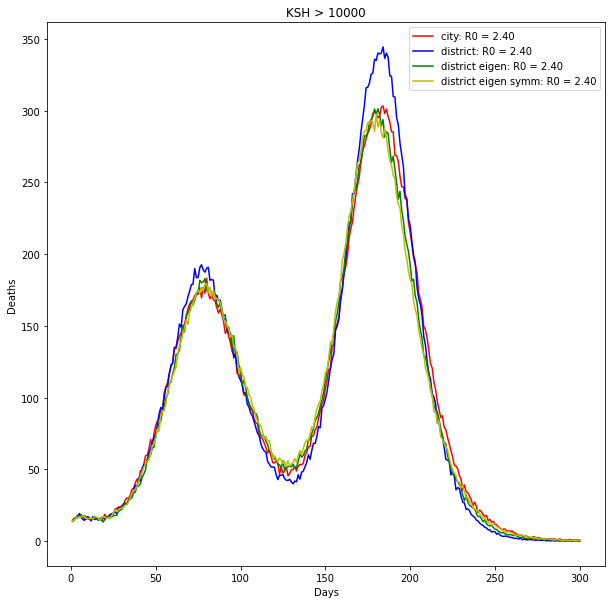

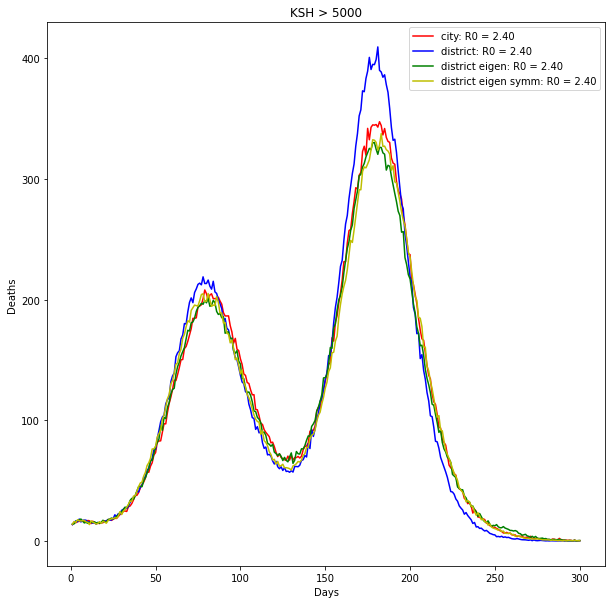

In [10]:
for th in [10000, 5000]:
    plt.figure(figsize=(10,10))
    city = f"KSH2_{th}/base"
    district = f"KSH2_{th}/district"
    district_eigen = f"KSH2_{th}/district_eigen"
    district_eigen_symm = f"KSH2_{th}/district_eigen_symm"

    R0 = np.linspace(2.0, 2.6, 10)
    for i in [6]:
        death, Is, Is2 = get_inf_curve(f"../../output/{city}/{i}.txt", death = death_ratio*10)
        death_d, Is_d, Is2_d = get_inf_curve(f"../../output/{district}/{i}.txt", death = death_ratio*10)
        death_d2, Is_d2, Is2_d2 = get_inf_curve(f"../../output/{district_eigen}/{i}.txt", death = death_ratio*10)
        death_d3, Is_d3, Is2_d3 = get_inf_curve(f"../../output/{district_eigen_symm}/{i}.txt", death = death_ratio*10)

        x = np.array(list(range(1, len(death)+1)))
        plt.plot(x, death, label=f"city: R0 = {R0[i]:.2f}", c='r')
        x = np.array(list(range(1, len(death_d)+1)))
        plt.plot(x, death_d, label=f"district: R0 = {R0[i]:.2f}", c='b')
        plt.plot(x, death_d2, label=f"district eigen: R0 = {R0[i]:.2f}", c='g')
        plt.plot(x, death_d3, label=f"district eigen symm: R0 = {R0[i]:.2f}", c='y')
        #x = np.array(list(range(1, len(death_d2)+1)))
        #plt.plot(x, death_d2, label=f"district_eigen: R0 = {R0[i]:.2f}", c='g')

    plt.legend()
    plt.xlabel('Days')
    plt.ylabel("Deaths")
    plt.title(f"KSH > {th}")

    print(f"City has {100-100*sum(death)/sum(death_d):.2f}% less total infections")
    print(f"City has {100-100*sum(death)/sum(death_d2):.2f}% less total infections")

City has -120.00% less total infections


/home/doma945/p36/lib/python3.6/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


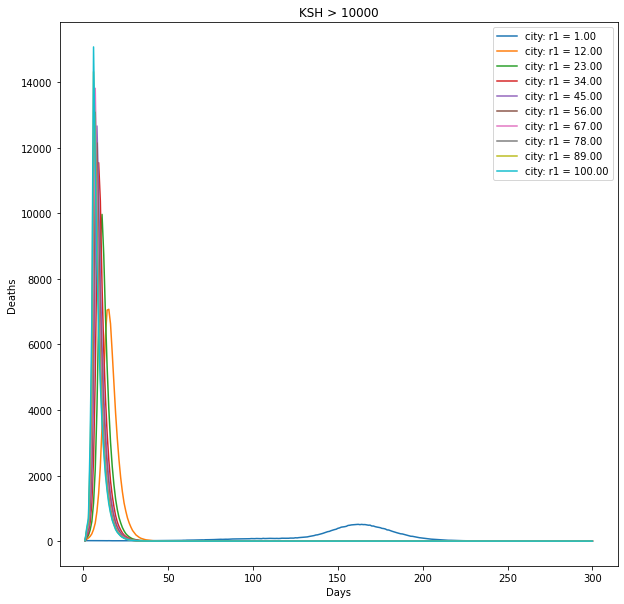

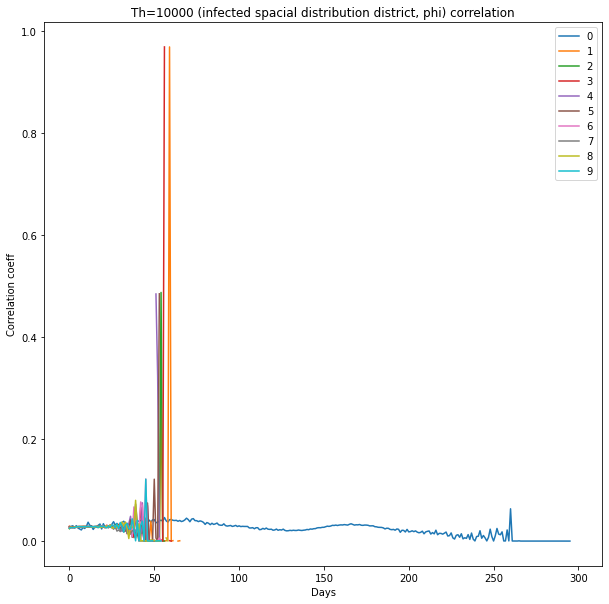

In [41]:
for th in [10000]:
    plt.figure(figsize=(10,10))
    #district = f"KSH_{th}/r1_dist"
    #eigen = f"KSH_{th}/r1_eigen"
    city = f"KSH_{th}/r1_base"

    r1 = np.linspace(1.0, 100.0, 10)
    for i in range(10):
        death, Is, Is2 = get_inf_curve(f"../../output/{city}/{i}.txt", death = death_ratio*10)

        x = np.array(list(range(1, len(death)+1)))
        plt.plot(x, death, label=f"city: r1 = {r1[i]:.2f}",)

    plt.legend()
    plt.xlabel('Days')
    plt.ylabel("Deaths")
    plt.title(f"KSH > {th}")

    print(f"City has {100-100*sum(death)/sum(death_d):.2f}% less total infections")

    
for th,phi in [(10000,phi_10000)]:
    plt.figure(figsize=(10,10))
    city = f"KSH_{th}/r1_base"

    I_all = []
    I_all_ = []
    for i in range(10):
        I, I2 = get_inf(f"../../output/{city}/{i}.txt", death = death_ratio*10)

        I_all = I+I2

        plt.plot([np.correlate(I_all[i]/np.sum(I_all[i]), phi_10000) for i in range(len(I_all))], label=f"{i}")
    plt.xlabel("Days")
    plt.ylabel("Correlation coeff")
    plt.title(f"Th={th} (infected spacial distribution district, phi) correlation")
    plt.legend()
    plt.show()

In [30]:
phi_10000.shape, np.sum(I_all, axis=0).shape

((167,), (111,))

In [32]:
np.sum(I_all, axis=0)/np.sum(I_all, axis=0)

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

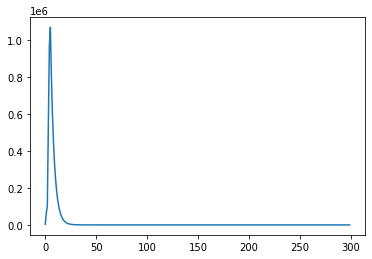

In [39]:
plt.plot(np.sum(I_all, axis=1))

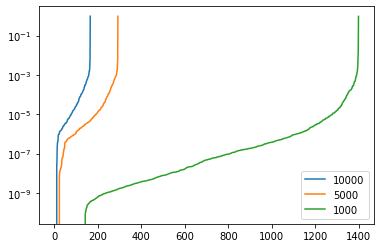

In [60]:
plt.plot(sorted(phi_10000), label="10000")
plt.plot(sorted(phi_5000), label="5000")
plt.plot(sorted(phi_1000), label="1000")
plt.yscale('log')
plt.legend()

In [57]:
d_10000

{'Abony': 3.260757520576968e-05,
 'Ajka': 3.0193364181223944e-06,
 'Albertirsa': 1.2471464419595845e-05,
 'Baja': 0.0003327189761937304,
 'Balassagyarmat': 8.093973884101386e-06,
 'Balatonfüred': 4.015663290005477e-07,
 'Balmazújváros': 1.300125560779524e-06,
 'Barcs': 4.88077626420804e-07,
 'Bátonyterenye': 9.78546740647182e-07,
 'Békés': 8.034850356873812e-05,
 'Békéscsaba': 0.0011580525448926144,
 'Berettyóújfalu': 3.2843719093749314e-06,
 'Biatorbágy': 3.779108751410921e-06,
 'Bicske': 1.0092522507271257e-06,
 'Bonyhád': 1.0133644352550758e-05,
 'Budakalász': 3.8074380868282666e-06,
 'Budakeszi': 1.1430791832555304e-05,
 'Budaörs': 5.579611546201599e-05,
 'Budapest 01. ker.': 6.722571972593272e-05,
 'Budapest 02. ker.': 0.0006275518219560837,
 'Budapest 03. ker.': 0.0007794008630549651,
 'Budapest 04. ker.': 0.00030798542385220744,
 'Budapest 05. ker.': 0.00016866437516831537,
 'Budapest 06. ker.': 0.0001819293259280922,
 'Budapest 07. ker.': 0.0003090302223777102,
 'Budapest 08. k

In [30]:
import branca
import requests
import folium
import branca.colormap as cmp

#colorscale = branca.colormap.linear.YlOrRd_09.scale(0, 50)
colorscale = cmp.LinearColormap(
    ['blue', 'white', "red"],
    vmin=0, vmax=0.0005,index=[0, 0.0001, 0.0005],
    caption='Color Scale for Map' #Caption for Color scale or Legend
)


def style_function(feature):
    change = d_5000[feature["properties"]["NAME"]] if feature["properties"]["NAME"] in d_5000 else None
    return {
        "fillOpacity": 0.5,
        "weight": 0,
        "fillColor": "#black" if change is None else colorscale(change),
    }


m = folium.Map(location=[47.49801,  19.03991], tiles="cartodbpositron", zoom_start=8)

loc = 'Largest eigenvector in the given cities [pop>5000]'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc) 
m.get_root().html.add_child(folium.Element(title_html))

folium.TopoJson(
    json.load(open("cities.topojson")),
    "objects.cities",
    style_function=style_function,
).add_to(m)
m.add_child(colorscale)

m

In [31]:
import branca
import requests
import folium
import branca.colormap as cmp

#colorscale = branca.colormap.linear.YlOrRd_09.scale(0, 50)
colorscale = cmp.LinearColormap(
    ['blue', 'white', "red"],
    vmin=0, vmax=0.0005,index=[0, 0.0001, 0.0005],
    caption='Color Scale for Map' #Caption for Color scale or Legend
)


def style_function(feature):
    change = d_1000[feature["properties"]["NAME"]] if feature["properties"]["NAME"] in d_1000 else None
    return {
        "fillOpacity": 0.5,
        "weight": 0,
        "fillColor": "#black" if change is None else colorscale(change),
    }


m = folium.Map(location=[47.49801,  19.03991], tiles="cartodbpositron", zoom_start=8)

loc = 'Largest eigenvector in the given cities [pop>1000]'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc) 
m.get_root().html.add_child(folium.Element(title_html))

folium.TopoJson(
    json.load(open("cities.topojson")),
    "objects.cities",
    style_function=style_function,
).add_to(m)
m.add_child(colorscale)

m

Text(0, 0.5, 'Eigenvector value')

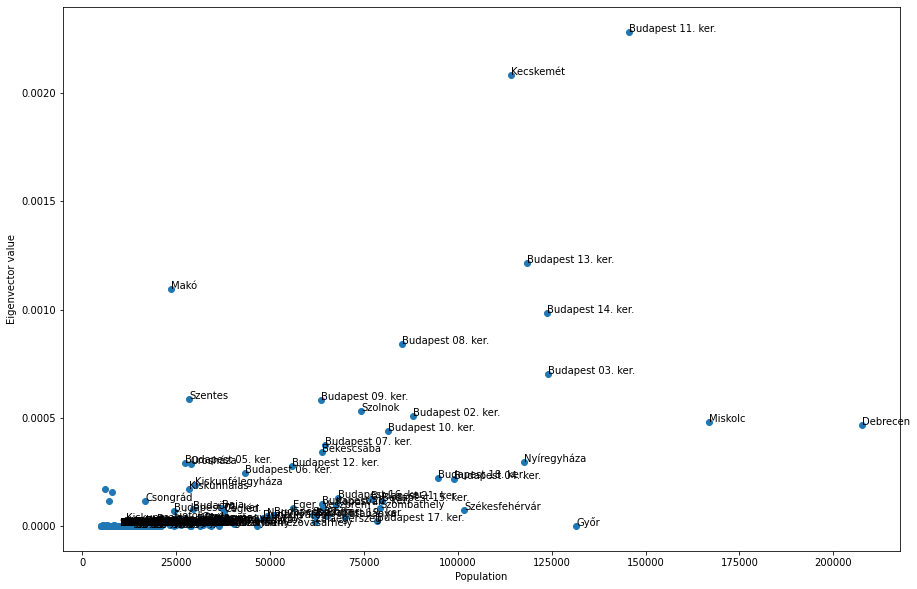

In [26]:
cities = [city for city in d_5000 if city not in ["Budapest", "Szeged", "Pécs"]]

plt.figure(figsize=(15,10))
X = [pops[city] for city in cities]
Y = [d_5000[city] for city in cities]
plt.scatter(X, Y)

#print(X,Y)
for i, city in enumerate(cities):
    if(X[i]>10000):
        plt.annotate(city, (X[i], Y[i]))

#plt.xscale("log")
#plt.yscale("log")
plt.xlabel("Population")
plt.ylabel("Eigenvector value")

Text(0, 0.5, 'Eigenvector value')

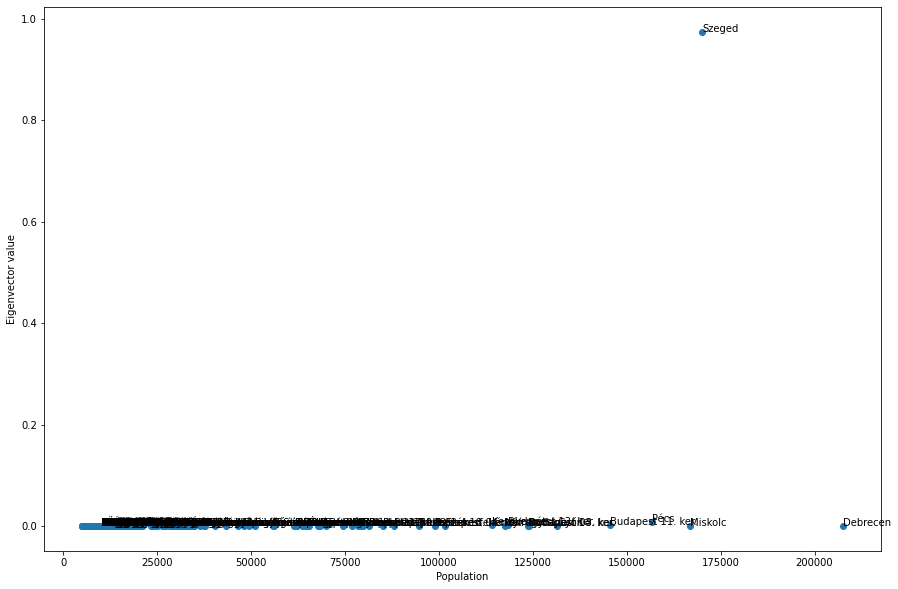

In [87]:
cities = [city for city in d_5000 if city not in ["Budapest"]]

plt.figure(figsize=(15,10))
X = [pops[city] for city in cities]
Y = [d_5000[city] for city in cities]
plt.scatter(X, Y)

#print(X,Y)
for i, city in enumerate(cities):
    if(X[i]>10000):
        plt.annotate(city, (X[i], Y[i]))

#plt.xscale("log")
#plt.yscale("log")
plt.xlabel("Population")
plt.ylabel("Eigenvector value")

In [63]:
import branca
import requests
import folium
import branca.colormap as cmp

#colorscale = branca.colormap.linear.YlOrRd_09.scale(0, 50)
colorscale = cmp.LinearColormap(
    ['blue', 'white', "red"],
    vmin=0, vmax=0.0005,index=[0, 0.0001, 0.0005],
    caption='Color Scale for Map' #Caption for Color scale or Legend
)


def style_function(feature):
    change = d_10000[feature["properties"]["NAME"]] if feature["properties"]["NAME"] in d_10000 else None
    return {
        "fillOpacity": 0.5,
        "weight": 0,
        "fillColor": "#black" if change is None else colorscale(change),
    }


m = folium.Map(location=[47.49801,  19.03991], tiles="cartodbpositron", zoom_start=8)

loc = 'Largest eigenvector in the given cities [pop>10000]'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc) 
m.get_root().html.add_child(folium.Element(title_html))

folium.TopoJson(
    json.load(open("cities.topojson")),
    "objects.cities",
    style_function=style_function,
).add_to(m)
m.add_child(colorscale)

m